In [50]:
import os
import bilby
import numpy as np 
import itertools
import matplotlib
from glob import glob
import matplotlib.pyplot as plt
import corner
import matplotlib.lines as mlines
import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

In [2]:
from matplotlib import rc
rc('text', usetex=True)
rc('font', family='serif')
rc('font', serif='times')
rc('mathtext', default='sf')
rc("lines", markeredgewidth=1)
rc("lines", linewidth=1)
rc('axes', titlesize=24) #24
rc('axes', labelsize=24) #24
rc("axes", linewidth=1) #2)
rc('axes', labelpad=20) #24)
rc('xtick', labelsize=16)
rc('ytick', labelsize=16)
rc('legend', fontsize=16)
rc('ytick', right='True',direction= 'in')
rc('xtick', top='True',direction= 'in')
rc('xtick.major', pad=15) #8)
rc('ytick.major', pad=15) #8)
rc('xtick.major', size=12) #8)
rc('ytick.major', size=12) #8)
rc('xtick.minor', size=7) #8)
rc('ytick.minor', size=7) #8)
rc('figure', titlesize=27) #24)

def set_tick_sizes(ax, major, minor):
    for l in ax.get_xticklines() + ax.get_yticklines():
        l.set_markersize(major)
    for tick in ax.xaxis.get_minor_ticks() + ax.yaxis.get_minor_ticks():
        tick.tick1line.set_markersize(minor)
        tick.tick2line.set_markersize(minor)
    ax.xaxis.LABELPAD=10.
    ax.xaxis.OFFSETTEXTPAD=10.

## Injections

In [3]:
mchirpratio, snrratio = [.5, 1., 2.], [.5, 1.]
delta_tc = [-.1, -.05, -.03, -.02, -.01, .01, .02, .03, .05, .1]

combinations = list(itertools.product(mchirpratio, snrratio, delta_tc))

data_a, data_b = [], []
mchirp_a, mchirp_b = np.zeros(len(combinations)), np.zeros(len(combinations))
q_a, q_b = np.zeros(len(combinations)), np.zeros(len(combinations))
eta_a, eta_b = np.zeros(len(combinations)), np.zeros(len(combinations))
eff_spin_a, eff_spin_b = np.zeros(len(combinations)), np.zeros(len(combinations))
delta_tc, snr_a, snr_b = np.zeros(len(combinations)), np.zeros(len(combinations)), np.zeros(len(combinations))

for i in range(len(combinations)):
    data_a.append(np.load('../../output/pe_population_3G/injections/SINGLES_A_{}_{}_{}.npy'.format(combinations[i][0], combinations[i][1], combinations[i][2]), allow_pickle=True).item())
    data_b.append(np.load('../../output/pe_population_3G/injections/SINGLES_B_{}_{}_{}.npy'.format(combinations[i][0], combinations[i][1], combinations[i][2]), allow_pickle=True).item())

    mchirp_a[i], mchirp_b[i] = np.power(data_a[i]['mass_1']*data_a[i]['mass_2'], (3/5))/np.power(data_a[i]['mass_1']+data_a[i]['mass_2'], (1/5)), np.power(data_b[i]['mass_1']*data_b[i]['mass_2'], (3/5))/np.power(data_b[i]['mass_1']+data_b[i]['mass_2'], (1/5))
    q_a[i], q_b[i] = data_a[i]['mass_2']/data_a[i]['mass_1'], data_b[i]['mass_2']/data_b[i]['mass_1']
    eta_a[i], eta_b[i] = (data_a[i]['mass_1']*data_a[i]['mass_2'])/np.power(data_a[i]['mass_1']+data_a[i]['mass_2'], 2), (data_b[i]['mass_1']*data_b[i]['mass_2'])/np.power(data_b[i]['mass_1']+data_b[i]['mass_2'], 2)
    eff_spin_a[i], eff_spin_b[i] = data_a[i]['a_1'], data_b[i]['a_1']

    delta_tc[i] = data_b[i]['geocent_time'] - data_a[i]['geocent_time']
    snr_a[i], snr_b[i] = data_a[i]['snr_det'], data_b[i]['snr_det']

## Unlensed Quasi-Circular Recovery

In [4]:
mchirp, log_bayes_factor = np.zeros(len(combinations)), np.zeros(len(combinations))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])

    mchirp[i] = result.posterior['chirp_mass'].median()
    log_bayes_factor[i] = result.log_bayes_factor

In [ ]:
snr = np.zeros(len(combinations))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    snr[i] = np.sqrt(result.posterior['H1_optimal_snr'].median()**2+result.posterior['L1_optimal_snr'].median()**2+result.posterior['V1_optimal_snr'].median()**2)

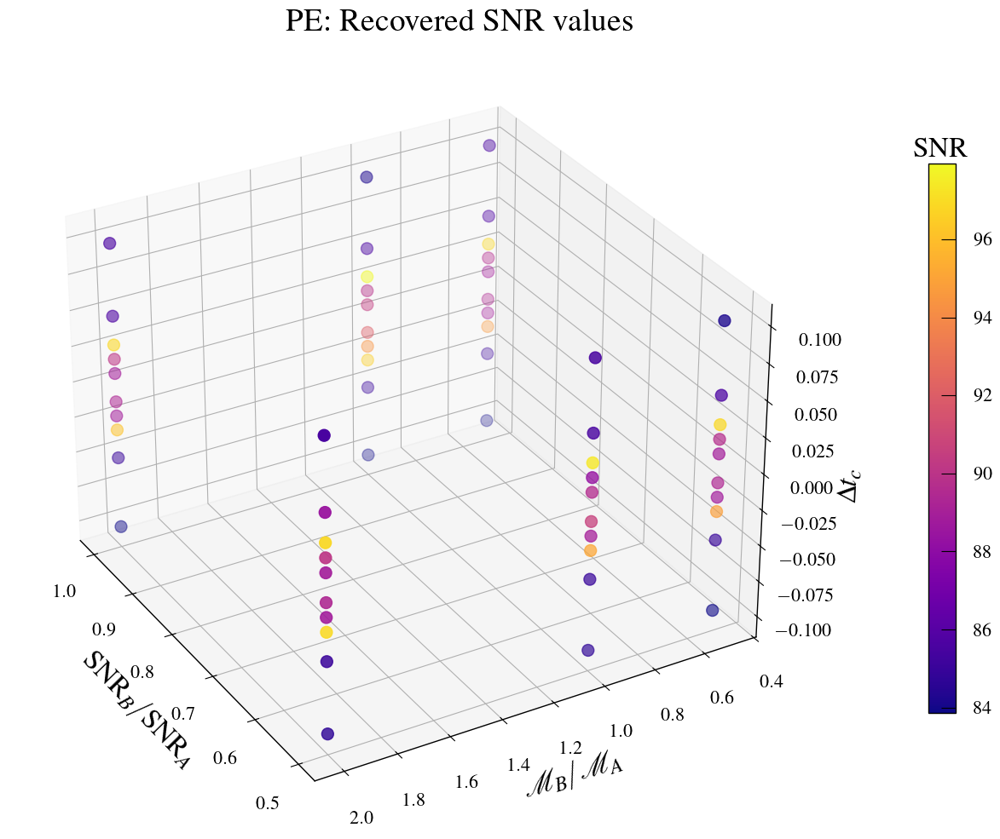

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter = axes.scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=snr, edgecolor=None, cmap='plasma', s=100)
axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

clb = fig.colorbar(scatter, ax=axes, shrink=0.7, pad=0.1)
clb.ax.set_title('$\mathrm{SNR}$')

plt.suptitle('PE: Recovered SNR values')
plt.tight_layout()
plt.show()

In [7]:
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])

    plot1 = result.plot_corner(
        parameters=["chirp_mass", "mass_ratio"], save=False
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe/Mq_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()
    
    plot2 = result.plot_corner(
        parameters=["mass_1", "mass_2"], save=False
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe/m1m2_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

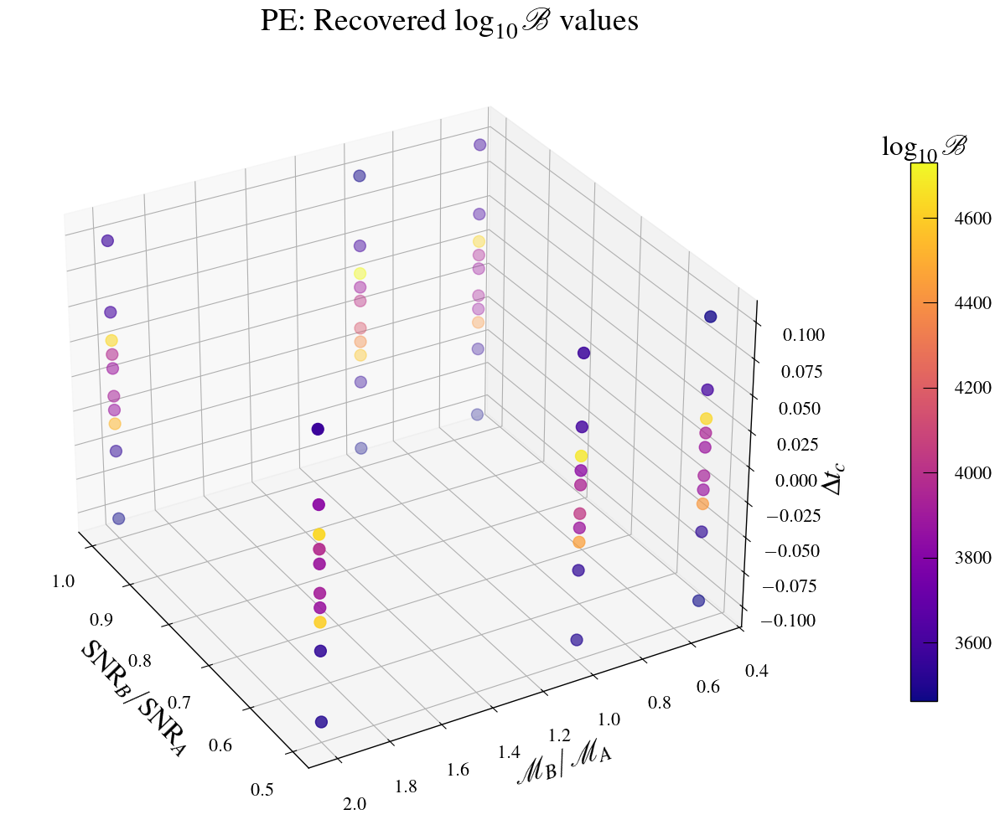

In [8]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter = axes.scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=log_bayes_factor, edgecolor=None, cmap='plasma', s=100)
axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

clb = fig.colorbar(scatter, ax=axes, shrink=0.7, pad=0.1)
clb.ax.set_title('$\log_{10}\mathcal{B}$')

plt.suptitle('PE: Recovered $\log_{10}\mathcal{B}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/PE_BF(3D).png')
plt.show()

### Cummulative Plots

In [9]:
bias_mchirp_a = np.abs(mchirp-mchirp_a)/mchirp_a*100
bias_mchirp_b = np.abs(mchirp-mchirp_b)/mchirp_b*100

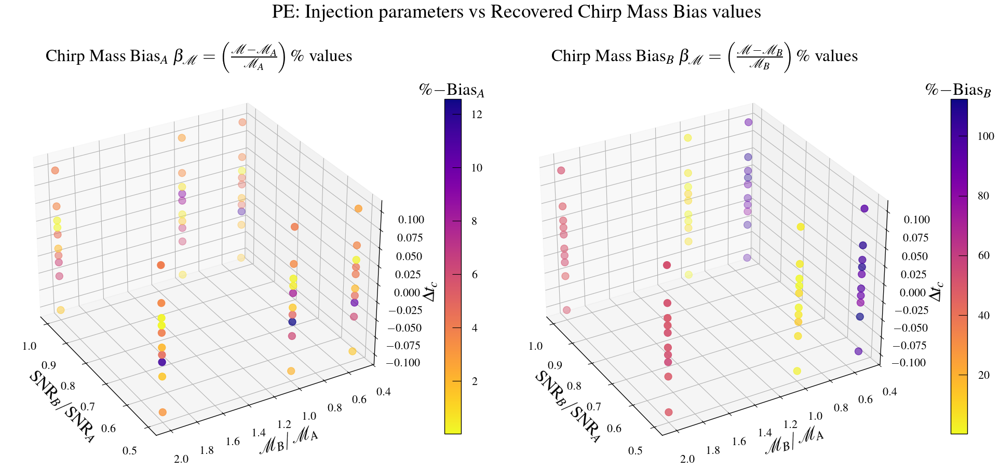

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_a, edgecolor=None, cmap='plasma_r', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\%-$Bias$_A$')
clb1.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Chirp Mass Bias$_A$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_A}{\\mathcal{M}_A}\\right)\\%$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_b, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$\\%-$Bias$_B$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Chirp Mass Bias$_B$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_B}{\\mathcal{M}_B}\\right)\\%$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

fig.suptitle('PE: Injection parameters vs Recovered Chirp Mass Bias values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/MCHIRP_BIAS.png')
plt.show()

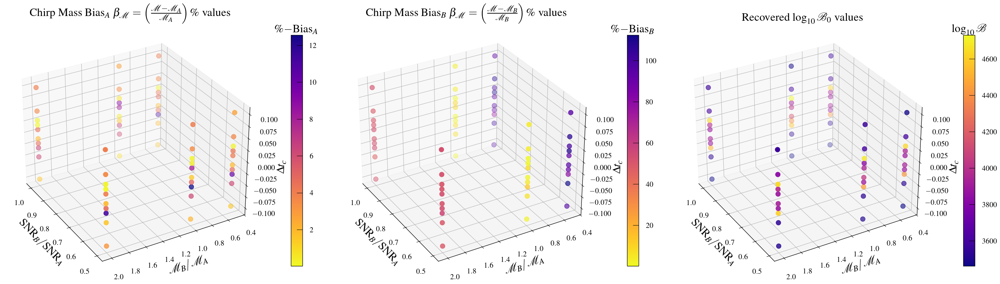

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_a, edgecolor=None, cmap='plasma_r', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\%-$Bias$_A$')
clb1.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Chirp Mass Bias$_A$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_A}{\\mathcal{M}_A}\\right)\\%$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_b, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$\\%-$Bias$_B$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Chirp Mass Bias$_B$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_B}{\\mathcal{M}_B}\\right)\\%$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=log_bayes_factor, edgecolor=None, cmap='plasma', s=100)
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')
axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SinglesPE.pdf', dpi=600, bbox_inches='tight')
plt.show()

## Lensed Recovery

In [12]:
mchirp_ml, log_bayes_factor_ml = np.zeros(len(combinations)), np.zeros(len(combinations))
Mlz_recovered, yl_recovered = np.zeros(len(combinations)), np.zeros(len(combinations))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    Mlz_recovered[i] = 10**(result.posterior['Log_Mlz'].median())
    yl_recovered[i] = result.posterior['yl'].median()
    mchirp_ml[i] = result.posterior['chirp_mass'].median()
    log_bayes_factor_ml[i] = result.log_bayes_factor
    
log_bayes_factor_ml_diff = log_bayes_factor_ml-log_bayes_factor

lal.MSUN_SI != Msun
__name__ = gwsurrogate.new.spline_evaluation
__package__= gwsurrogate.new


In [13]:
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])

    plot1 = result.plot_corner(
        parameters=["chirp_mass", "mass_ratio"], save=False
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml/Mq_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()
    
    plot2 = result.plot_corner(
        parameters=["mass_1", "mass_2"], save=False
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml/m1m2_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

    result.posterior.loc[np.isnan(result.posterior['Log_Mlz']), 'Log_Mlz'] = 0
    result.posterior.loc[np.isnan(result.posterior['yl']), 'yl'] = 0

    plot3 = result.plot_corner(
        parameters=["Log_Mlz", "yl"], save=False
    )
    plot3.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot3.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml/Mlz_yl_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

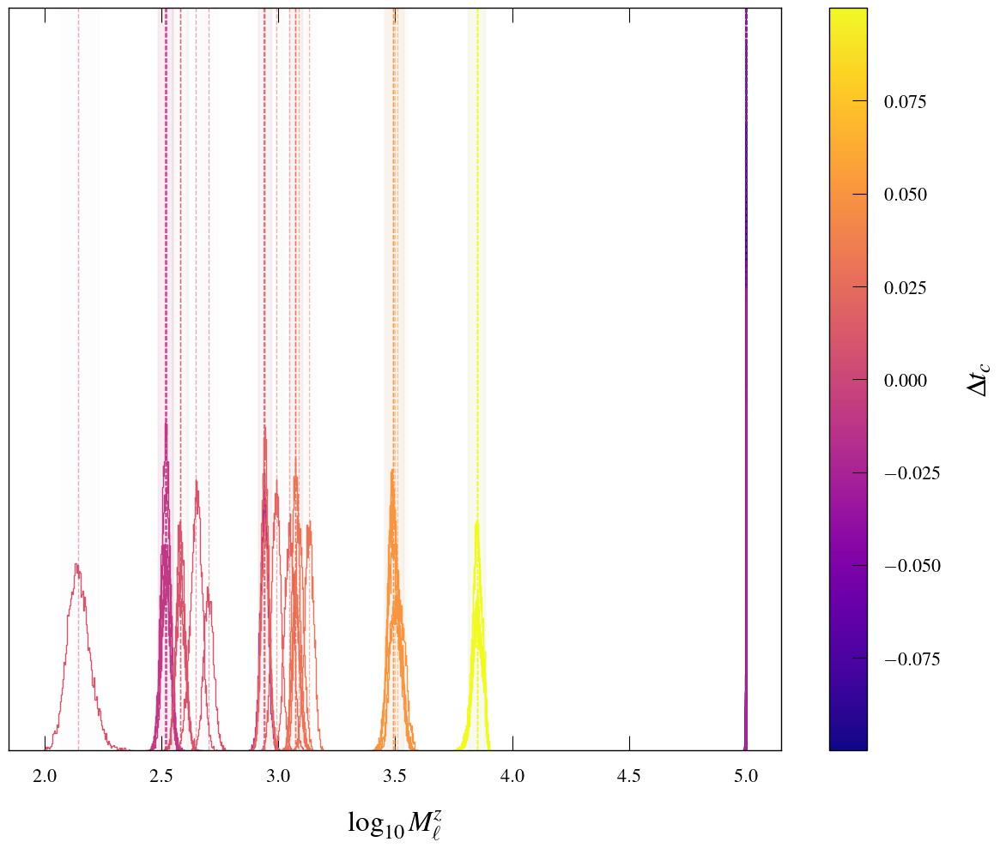

In [46]:
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=np.min(delta_tc), vmax=np.max(delta_tc)), cmap='plasma')
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0]) 
    ax.hist(result.posterior['Log_Mlz'], bins=100, histtype='step', color=sm.to_rgba(delta_tc[i]))
    ax.axvline(np.log10(Mlz_recovered)[i], color=sm.to_rgba(delta_tc[i]), linestyle='--', alpha=.5)
    ax.axvspan(np.percentile(result.posterior['Log_Mlz'], 5),
               np.percentile(result.posterior['Log_Mlz'], 95),
               alpha=0.01, color=sm.to_rgba(delta_tc[i]))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('$\\Delta t_c$')
ax.set_xlabel('$\log_{10}{M}_{\ell}^z$')
ax.yaxis.set_ticks([])
#ax.set_title('Recovered Redshifted Lens Mass $M_{\ell}^z$ values for Microlensing')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/MLz.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

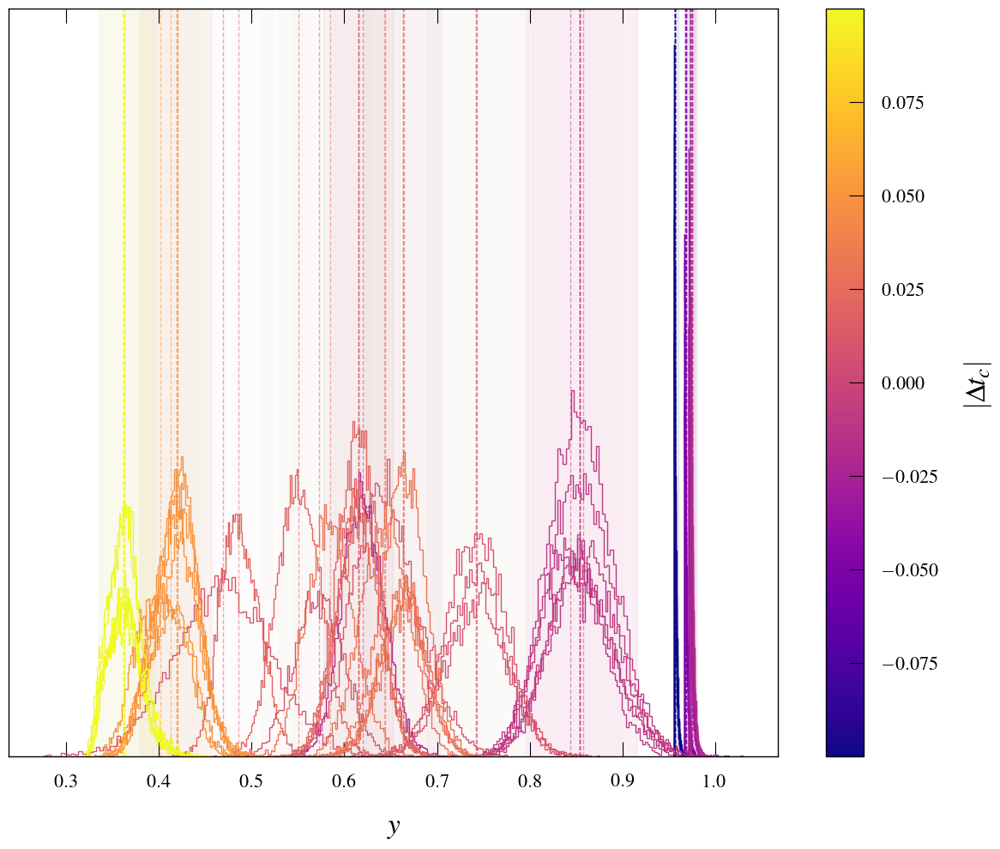

In [45]:
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=np.min(delta_tc), vmax=np.max(delta_tc)), cmap='plasma')
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0]) 
    ax.hist(result.posterior['yl'], bins=100, histtype='step', color=sm.to_rgba(delta_tc[i]))
    ax.axvline(yl_recovered[i], color=sm.to_rgba(delta_tc[i]), linestyle='--', alpha=.5)
    ax.axvspan(np.percentile(result.posterior['yl'], 5),
               np.percentile(result.posterior['yl'], 95),
               alpha=0.01, color=sm.to_rgba(delta_tc[i]))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('$|\\Delta t_c|$')
ax.set_xlabel('$y$')
ax.yaxis.set_ticks([])
#ax.set_title('Recovered Impact Parameter $y$ values for Microlensing')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/yl.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

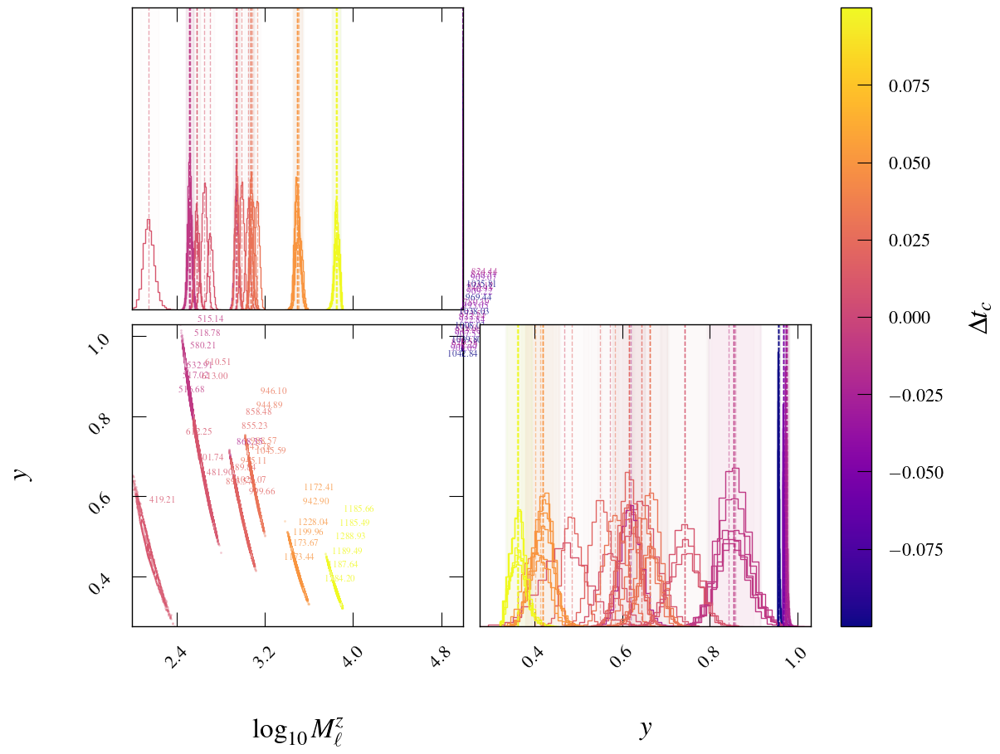

In [61]:
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=np.min(delta_tc), vmax=np.max(delta_tc)), cmap='plasma')
results = []
fig = None
legend_handles = []

for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(
        combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    results.append(result)
    
    samples = np.vstack([result.posterior['Log_Mlz'], result.posterior['yl']]).T
    
    color = sm.to_rgba(delta_tc[i])
    label = '{}-{}-{}'.format(combinations[i][0], combinations[i][1], combinations[i][2])
    
    if fig is None:
        fig = corner.corner(
            samples,
            labels=[r'$\log_{10}{M}_{\ell}^z$', r'$y$'],
            color=color,
            plot_datapoints=True,
            hist_kwargs={'histtype': 'step'},
            data_kwargs={'alpha': 0.3}
        )
    else:
        corner.corner(
        samples,
        labels=[r'$\log_{10}{M}_{\ell}^z$', r'$y$'],
        color=color,
        fig=fig,
        plot_datapoints=True,
        hist_kwargs={'histtype': 'step'},
        data_kwargs={'alpha': 0.3}
        )
    
fig.set_size_inches(12, 10)

for i in range(len(combinations)):
    color = sm.to_rgba(delta_tc[i])
    
    fig.axes[0].axvline(np.log10(Mlz_recovered)[i], color=color, linestyle='--', alpha=.5)
    fig.axes[0].axvspan(np.percentile(results[i].posterior['Log_Mlz'], 5),
                     np.percentile(results[i].posterior['Log_Mlz'], 95),
                     alpha=0.01, color=color)

    fig.axes[3].axvline(yl_recovered[i], color=color, linestyle='--', alpha=.5)
    fig.axes[3].axvspan(np.percentile(results[i].posterior['yl'], 5),
                     np.percentile(results[i].posterior['yl'], 95),
                     alpha=0.01, color=color)
    
    fig.axes[2].text(
        np.median(results[i].posterior['Log_Mlz']) + 0.0035 * i,
        np.median(results[i].posterior['yl']) + 0.0035 * i,
        f"{log_bayes_factor_ml_diff[i]:.2f}",
        color=color,
        fontsize=8,         # Adjust font size as needed
        ha='center',
        va='center',
        alpha=0.8
    )
    
cbar = fig.colorbar(sm, ax=fig.get_axes(), fraction=0.046, pad=0.04)
cbar.set_label(r'$\Delta t_c$')
plt.savefig('../../output/pe_population_3G/output/ylMlz.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

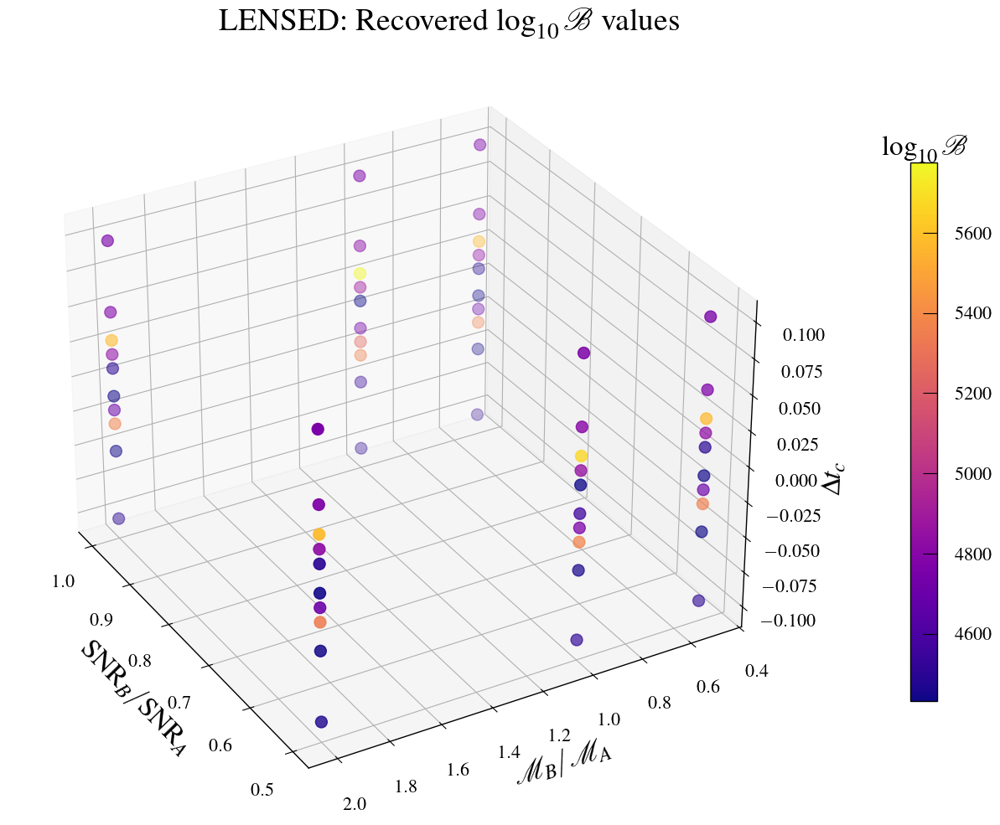

In [18]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter = axes.scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=log_bayes_factor_ml, edgecolor=None, cmap='plasma', s=100)

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

clb = fig.colorbar(scatter, ax=axes, shrink=0.7, pad=0.1)
clb.ax.set_title('$\log_{10}\mathcal{B}$')

plt.suptitle('LENSED: Recovered $\log_{10}\mathcal{B}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/LENSED_BF(3D).png')
plt.show()

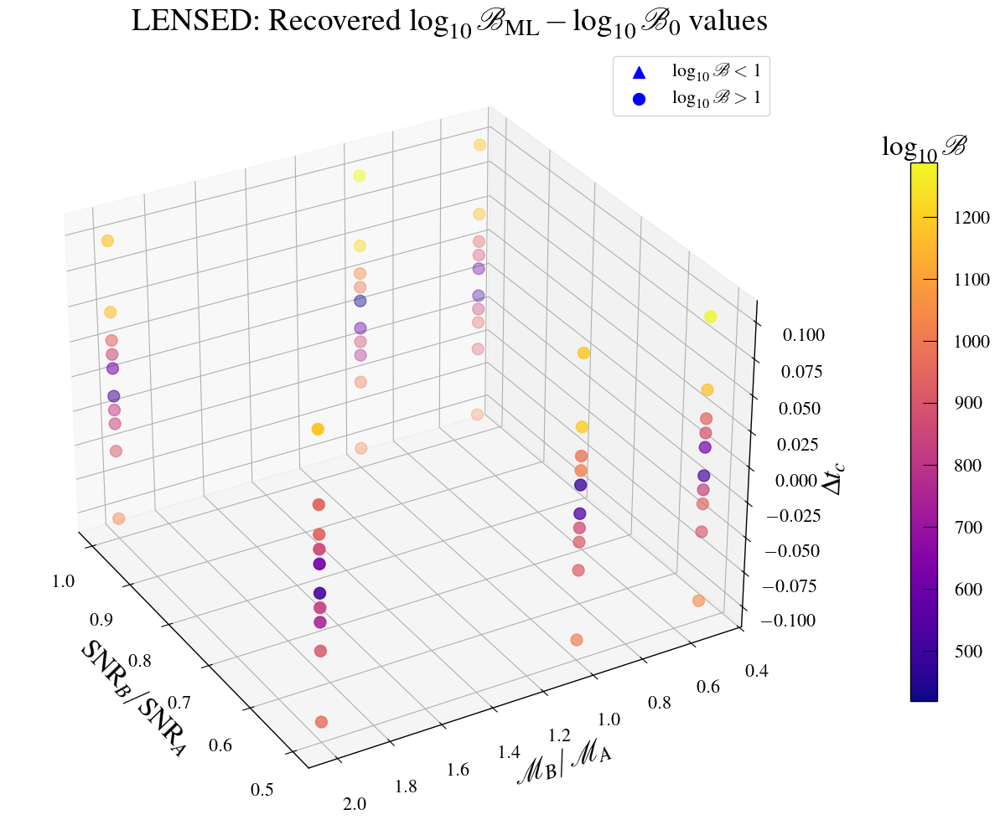

In [19]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

diff_greater_1 = np.where(log_bayes_factor_ml_diff > 1)
diff_0_1 = np.where(log_bayes_factor_ml_diff <= 1)

scatter3 = axes.scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
scatter5 = axes.scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
clb3 = fig.colorbar(scatter3, ax=axes, shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

axes.scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes.scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes.legend(loc='upper right')

plt.suptitle('LENSED: Recovered $\log_{10}\mathcal{B}_{\mathrm{ML}}-\log_{10}\mathcal{B}_{0}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/LENSED_BF_DIFF(3D).png')
plt.show()

### Cummulative Plots & Comparisions

In [20]:
bias_mchirp_a_ml = np.abs(mchirp_ml-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml = np.abs(mchirp_ml-mchirp_b)/mchirp_b*100

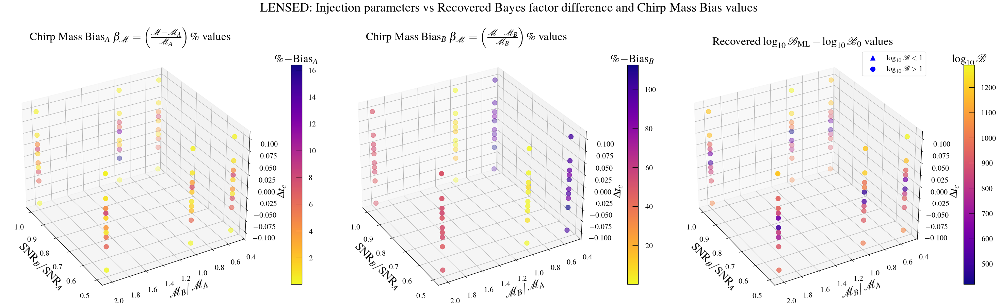

In [21]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_a_ml, edgecolor=None, cmap='plasma_r', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\%-$Bias$_A$')
clb1.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Chirp Mass Bias$_A$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_A}{\\mathcal{M}_A}\\right)\\%$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_b_ml, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$\\%-$Bias$_B$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Chirp Mass Bias$_B$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_B}{\\mathcal{M}_B}\\right)\\%$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{ML}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

fig.suptitle('LENSED: Injection parameters vs Recovered Bayes factor difference and Chirp Mass Bias values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/ML_MCHIRP_BIAS.png')
plt.show()

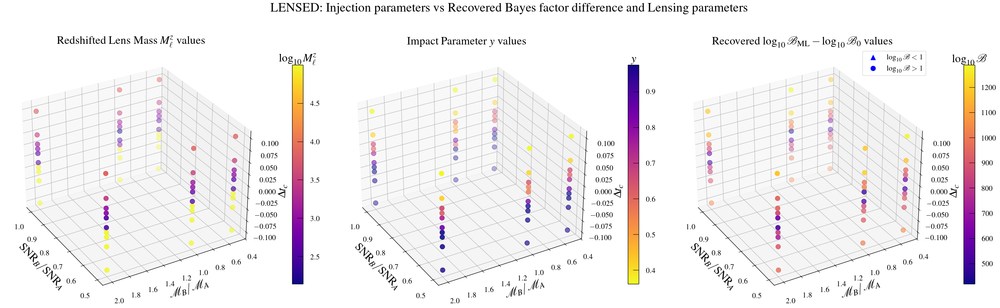

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=np.log10(Mlz_recovered), edgecolor=None, cmap='plasma', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\log_{10} M_{\ell}^z$')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Redshifted Lens Mass $M_{\ell}^z$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=yl_recovered, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$y$')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Impact Parameter $y$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\log_{10}\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{ML}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

fig.suptitle('LENSED: Injection parameters vs Recovered Bayes factor difference and Lensing parameters')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/LENSED_MLz_yl_BF(3D).png')
plt.show()

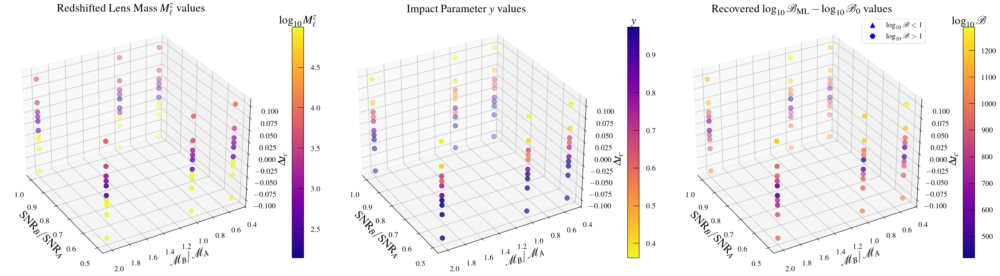

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=np.log10(Mlz_recovered), edgecolor=None, cmap='plasma', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\log_{10} M_{\ell}^z$')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Redshifted Lens Mass $M_{\ell}^z$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=yl_recovered, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$y$')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Impact Parameter $y$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml_diff), vmax=np.max(log_bayes_factor_ml_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\log_{10}\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{ML}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/MicrolensedRecoveryParameters.pdf', dpi=600, bbox_inches='tight')
plt.show()

In [24]:
for i in range(len(combinations)):
    fs_pe = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    fs_pe_ml = glob('../../output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    
    result_pe = bilby.result.read_in_result(filename=fs_pe[0])
    result_pe_ml = bilby.result.read_in_result(filename=fs_pe_ml[0])

    plot1 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Microlensed'], save=False, parameters=["chirp_mass", "mass_ratio"],
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/Mq_PE_PE_ML_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

    plot2 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Microlensed'], save=False, parameters=["mass_1", "mass_2"],
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/m1m2_PE_PE_ML_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

### Type II Lensed

In [25]:
mchirp_ml2, log_bayes_factor_ml2 = np.zeros(len(combinations)), np.zeros(len(combinations))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML2_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    mchirp_ml2[i] = result.posterior['chirp_mass'].median()
    log_bayes_factor_ml2[i] = result.log_bayes_factor
    
log_bayes_factor_ml2_diff = log_bayes_factor_ml2-log_bayes_factor

In [26]:
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML2_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])

    plot1 = result.plot_corner(
        parameters=["chirp_mass", "mass_ratio"], save=False
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml2/Mq_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()
    
    plot2 = result.plot_corner(
        parameters=["mass_1", "mass_2"], save=False
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml2/m1m2_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

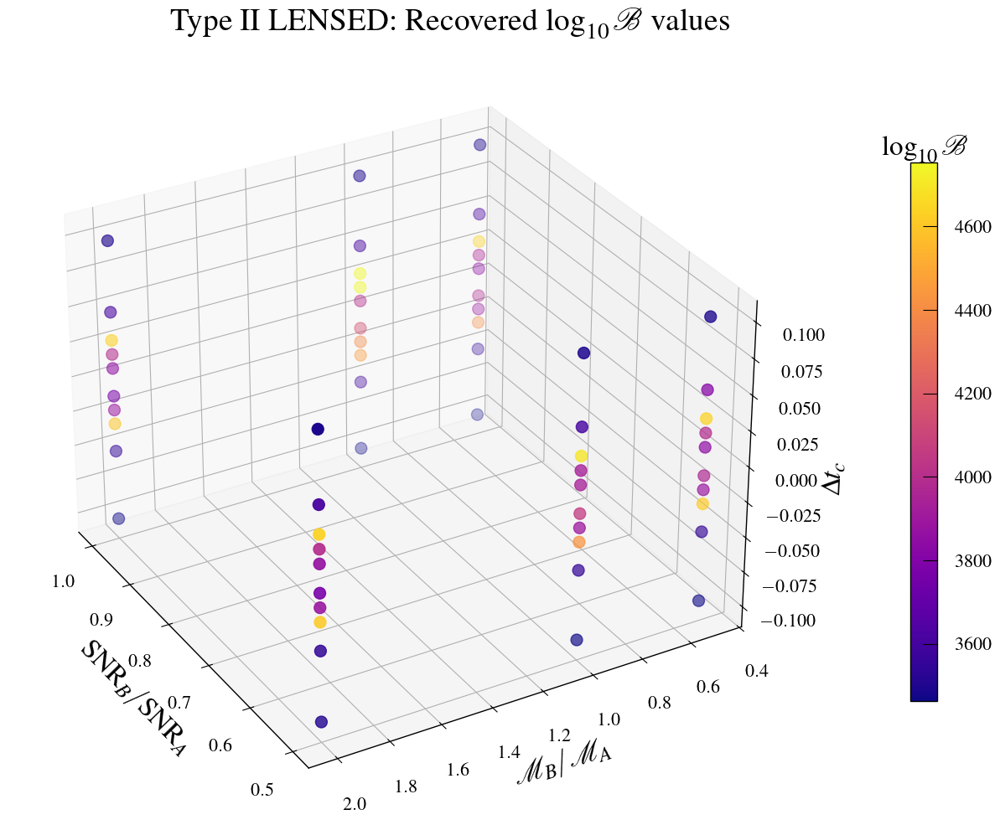

In [27]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter = axes.scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=log_bayes_factor_ml2, edgecolor=None, cmap='plasma', s=100)

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

clb = fig.colorbar(scatter, ax=axes, shrink=0.7, pad=0.1)
clb.ax.set_title('$\log_{10}\mathcal{B}$')

plt.suptitle('Type II LENSED: Recovered $\log_{10}\mathcal{B}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2_BF(3D).png')
plt.show()

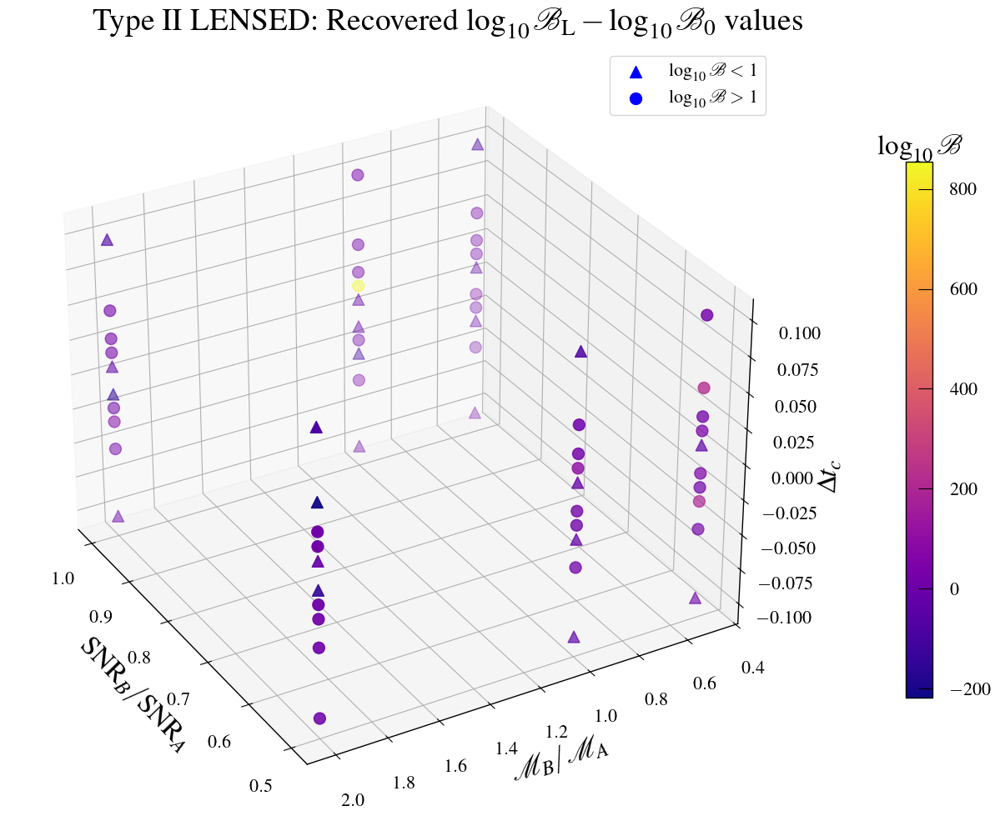

In [28]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

diff_greater_1 = np.where(log_bayes_factor_ml2_diff > 1)
diff_0_1 = np.where(log_bayes_factor_ml2_diff <= 1)

scatter3 = axes.scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
scatter5 = axes.scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
clb3 = fig.colorbar(scatter3, ax=axes, shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

axes.scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes.scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes.legend(loc='upper right')

plt.suptitle('Type II LENSED: Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2_BF_DIFF(3D).png')
plt.show()

### Cummulative Plots & Comparisions

In [29]:
bias_mchirp_a_ml2 = np.abs(mchirp_ml2-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml2 = np.abs(mchirp_ml2-mchirp_b)/mchirp_b*100

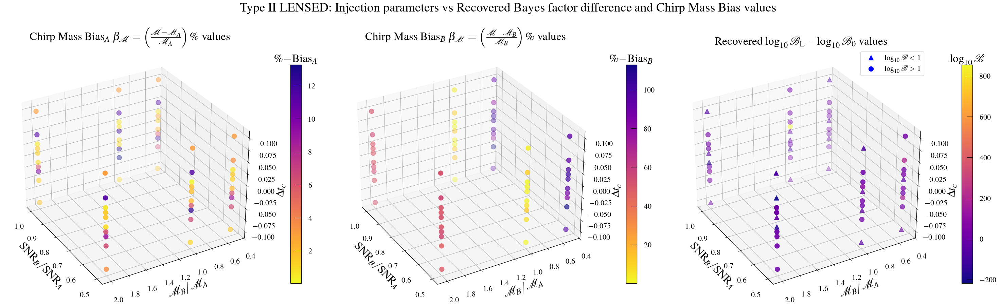

In [30]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_a_ml2, edgecolor=None, cmap='plasma_r', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\%-$Bias$_A$')
clb1.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Chirp Mass Bias$_A$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_A}{\\mathcal{M}_A}\\right)\\%$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_b_ml2, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$\\%-$Bias$_B$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Chirp Mass Bias$_B$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_B}{\\mathcal{M}_B}\\right)\\%$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

fig.suptitle('Type II LENSED: Injection parameters vs Recovered Bayes factor difference and Chirp Mass Bias values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2_MCHIRP_BIAS.png')
plt.show()

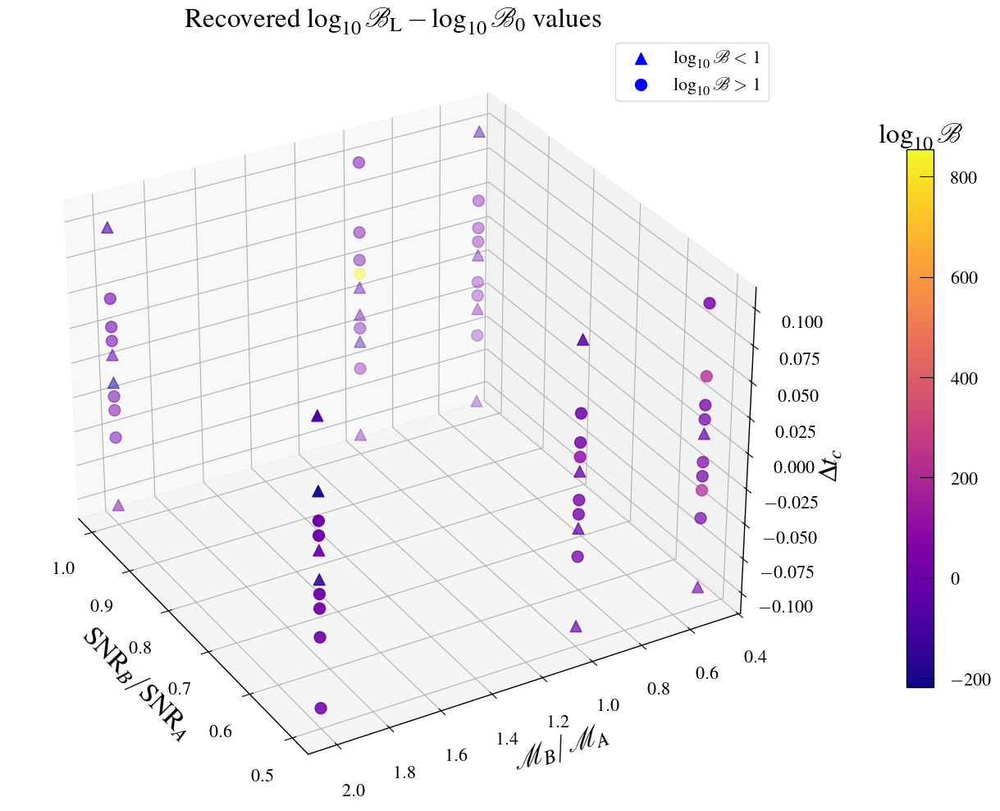

In [31]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter3 = axes.scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
scatter5 = axes.scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
clb3 = fig.colorbar(scatter3, ax=axes, shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes.scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes.scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes.legend(loc='upper right')

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/TypeIILensedRecovery.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

In [32]:
for i in range(len(combinations)):
    fs_pe = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    fs_pe_ml = glob('../../output/pe_population_3G/final_result/PE_ML2_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    
    result_pe = bilby.result.read_in_result(filename=fs_pe[0])
    result_pe_ml = bilby.result.read_in_result(filename=fs_pe_ml[0])

    plot1 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Type II Lensed'], save=False, parameters=["chirp_mass", "mass_ratio"],
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/Mq_PE_PE_ML2_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

    plot2 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Type II Lensed'], save=False, parameters=["mass_1", "mass_2"],
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/m1m2_PE_PE_ML2_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

### Type II Lensed (C)

In [33]:
mchirp_ml2c, log_bayes_factor_ml2c, n_ml2c = np.zeros(len(combinations)), np.zeros(len(combinations)), np.zeros(len(combinations))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML2C_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    n_ml2c[i] = (result.posterior['imagetype'].median()-1)/2
    mchirp_ml2c[i] = result.posterior['chirp_mass'].median()
    log_bayes_factor_ml2c[i] = result.log_bayes_factor
    
log_bayes_factor_ml2c_diff = log_bayes_factor_ml2c-log_bayes_factor

In [34]:
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML2C_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])

    plot1 = result.plot_corner(
        parameters=["chirp_mass", "mass_ratio"], save=False
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml2c/Mq_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()
    
    plot2 = result.plot_corner(
        parameters=["mass_1", "mass_2"], save=False
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml2c/m1m2_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

    plot3 = result.plot_corner(
        parameters=["imagetype"], save=False
    )
    plot3.axes[0].axvline(2*n_ml2c[i]+2, color='r', linestyle='--')
    plot3.suptitle('$2(n_j+1)={}$'.format(n_ml2c[i]))
    plot3.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/pe_ml2c/n_PE_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

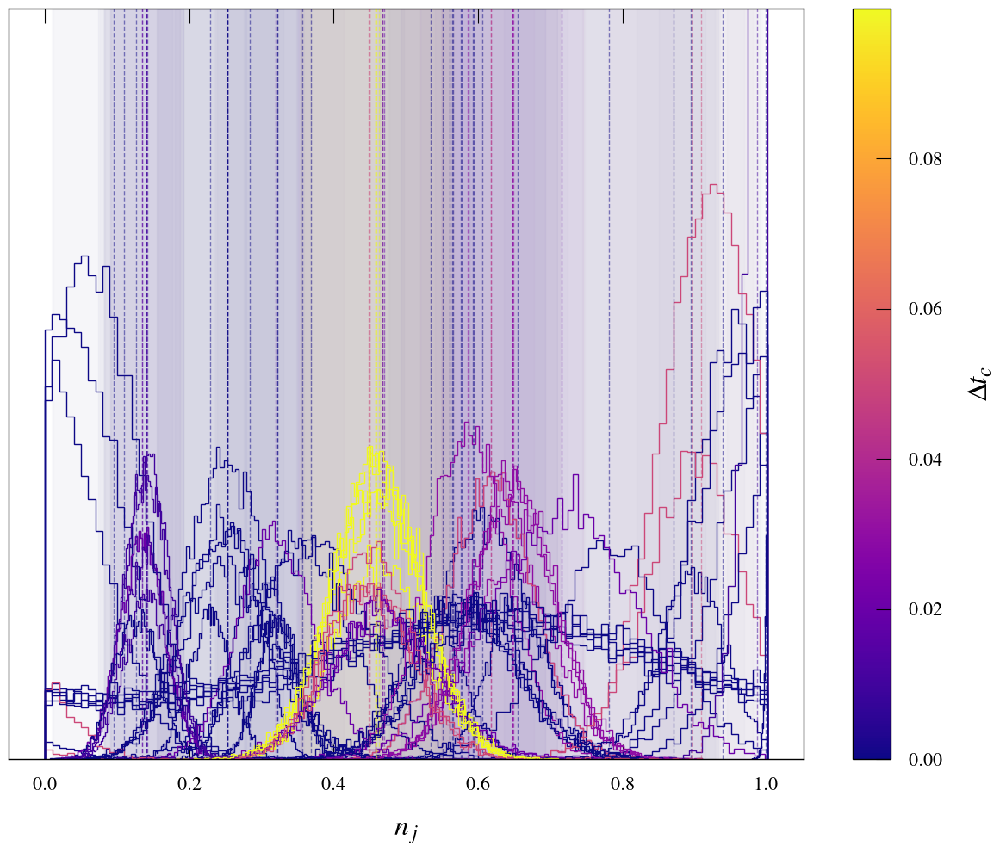

In [48]:
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=0, vmax=np.max(delta_tc)), cmap='plasma')
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
for i in range(len(combinations)):
    fs = glob('../../output/pe_population_3G/final_result/PE_ML2C_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0]) 
    
    ax.hist((result.posterior['imagetype']-1)/2, bins=100, histtype='step', color=sm.to_rgba(delta_tc[i]))
    ax.axvline(n_ml2c[i], color=sm.to_rgba(delta_tc[i]), linestyle='--', alpha=.5)
    ax.axvspan(np.percentile((result.posterior['imagetype']-1)/2, 5),
               np.percentile((result.posterior['imagetype']-1)/2, 95),
               alpha=0.01, color=sm.to_rgba(delta_tc[i]))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('$\\Delta t_c$')
ax.set_xlabel('$n_j$')
ax.set_ylim(0, 1200)
ax.yaxis.set_ticks([])
#ax.set_title('Recovered $n_j$ values for Type II Lensing')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/nj.pdf')
plt.show()
plt.close()

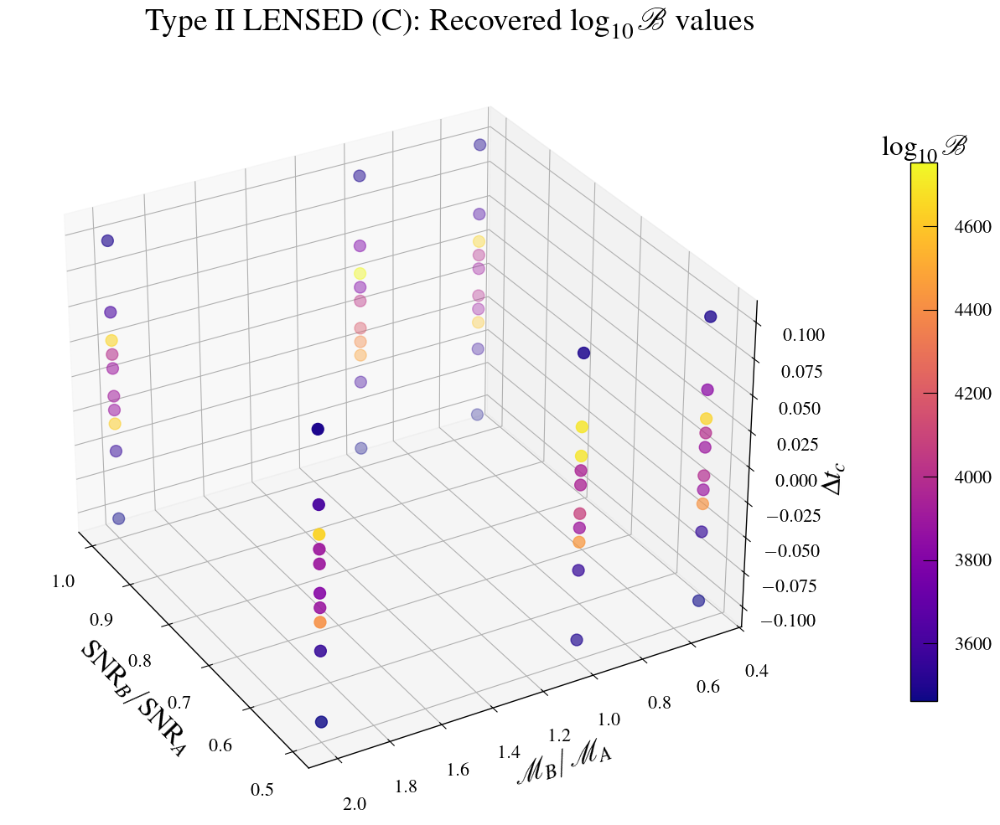

In [36]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

scatter = axes.scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=log_bayes_factor_ml2c, edgecolor=None, cmap='plasma', s=100)

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

clb = fig.colorbar(scatter, ax=axes, shrink=0.7, pad=0.1)
clb.ax.set_title('$\log_{10}\mathcal{B}$')

plt.suptitle('Type II LENSED (C): Recovered $\log_{10}\mathcal{B}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2C_BF(3D).png')
plt.show()

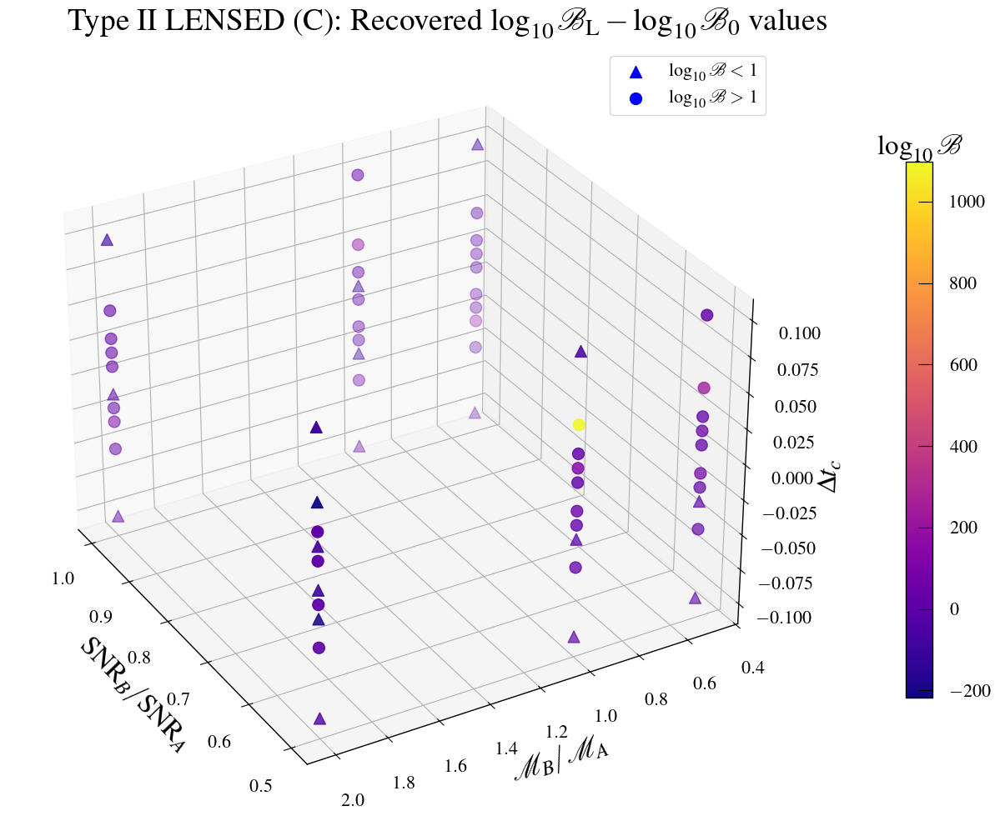

In [37]:
fig, axes = plt.subplots(1, 1, figsize=(16, 10), subplot_kw={'projection': '3d'})

diff_greater_1 = np.where(log_bayes_factor_ml2c_diff > 1)
diff_0_1 = np.where(log_bayes_factor_ml2c_diff <= 1)

scatter3 = axes.scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2c_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
scatter5 = axes.scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2c_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
clb3 = fig.colorbar(scatter3, ax=axes, shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes.set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes.set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes.set_zlabel('$\Delta t_c$')
axes.ticklabel_format(useOffset=False, style='plain')
axes.azim = 150

axes.scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes.scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes.legend(loc='upper right')

plt.suptitle('Type II LENSED (C): Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2C_BF_DIFF(3D).png')
plt.show()

### Cummulative Plots & Comparisions

In [38]:
bias_mchirp_a_ml2c = np.abs(mchirp_ml2c-mchirp_a)/mchirp_a*100
bias_mchirp_b_ml2c = np.abs(mchirp_ml2c-mchirp_b)/mchirp_b*100

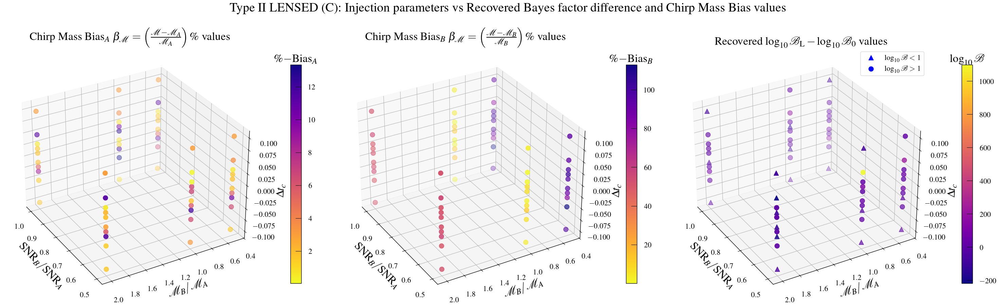

In [39]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_a_ml2c, edgecolor=None, cmap='plasma_r', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$\\%-$Bias$_A$')
clb1.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Chirp Mass Bias$_A$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_A}{\\mathcal{M}_A}\\right)\\%$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=bias_mchirp_b_ml2c, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$\\%-$Bias$_B$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Chirp Mass Bias$_B$ $\\beta_{\\mathcal{M}}=\\left(\\frac{\\mathcal{M}-\\mathcal{M}_B}{\\mathcal{M}_B}\\right)\\%$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2c_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2c_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

fig.suptitle('Type II LENSED (C): Injection parameters vs Recovered Bayes factor difference and Chirp Mass Bias values')
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/SL2C_MCHIRP_BIAS.png')
plt.show()

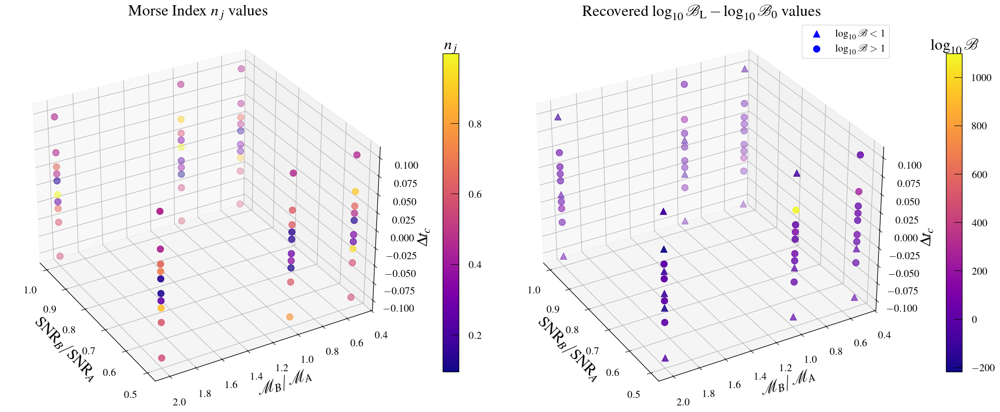

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(22, 10), subplot_kw={'projection': '3d'})

scatter1 = axes[0].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=n_ml2c, edgecolor=None, cmap='plasma', s=100)
clb1 = fig.colorbar(scatter1, ax=axes[0], shrink=0.7, pad=0.1)
clb1.ax.set_title('$n_j$')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Morse Index $n_j$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter3 = axes[1].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2c_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
scatter5 = axes[1].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2c_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
clb3 = fig.colorbar(scatter3, ax=axes[1], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\log_{10}\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[1].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[1].legend(loc='upper right')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/TypeIILensedRecoveryParameters.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

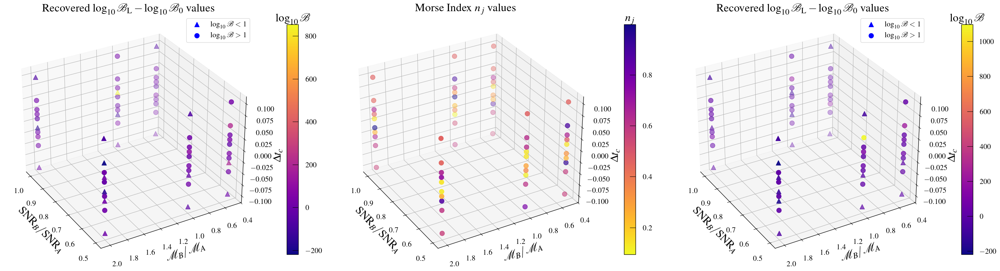

In [41]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10), subplot_kw={'projection': '3d'})

scatter3 = axes[0].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
scatter5 = axes[0].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2_diff), vmax=np.max(log_bayes_factor_ml2_diff))
clb3 = fig.colorbar(scatter3, ax=axes[0], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[0].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[0].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[0].legend(loc='upper right')

axes[0].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[0].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[0].set_zlabel('$\Delta t_c$')
axes[0].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[0].ticklabel_format(useOffset=False, style='plain')
axes[0].azim = 150

scatter2 = axes[1].scatter(snr_b/snr_a, mchirp_b/mchirp_a, delta_tc, c=n_ml2c, edgecolor=None, cmap='plasma_r', s=100)
clb2 = fig.colorbar(scatter2, ax=axes[1], shrink=0.7, pad=0.1)
clb2.ax.set_title('$n_j$')
clb2.ax.ticklabel_format(useOffset=False, style='plain')

axes[1].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[1].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[1].set_zlabel('$\Delta t_c$')
axes[1].set_title('Morse Index $n_j$ values', loc='center')
axes[1].ticklabel_format(useOffset=False, style='plain')
axes[1].azim = 150

scatter3 = axes[2].scatter(snr_b[diff_greater_1]/snr_a[diff_greater_1], mchirp_b[diff_greater_1]/mchirp_a[diff_greater_1], delta_tc[diff_greater_1], c=log_bayes_factor_ml2c_diff[diff_greater_1], edgecolor=None, cmap='plasma', s=100, marker='o', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
scatter5 = axes[2].scatter(snr_b[diff_0_1]/snr_a[diff_0_1], mchirp_b[diff_0_1]/mchirp_a[diff_0_1], delta_tc[diff_0_1], c=log_bayes_factor_ml2c_diff[diff_0_1], edgecolor=None, cmap='plasma', s=100, marker='^', vmin=np.min(log_bayes_factor_ml2c_diff), vmax=np.max(log_bayes_factor_ml2c_diff))
clb3 = fig.colorbar(scatter3, ax=axes[2], shrink=0.7, pad=0.1)
clb3.ax.set_title('$\\log_{10}\\mathcal{B}$')
clb3.ax.ticklabel_format(useOffset=False, style='plain')

axes[2].scatter([], [], c='b', s=100, marker='^', label='$\\log_{10}\\mathcal{B} < 1$')
axes[2].scatter([], [], c='b', s=100, marker='o', label='$\\log_{10}\\mathcal{B} > 1$')
axes[2].legend(loc='upper right')

axes[2].set_xlabel('$\mathrm{SNR}_B/\mathrm{SNR}_A$')
axes[2].set_ylabel('$\mathcal{M}_B/\mathcal{M}_A$')
axes[2].set_zlabel('$\Delta t_c$')
axes[2].set_title('Recovered $\log_{10}\mathcal{B}_{\mathrm{L}}-\log_{10}\mathcal{B}_{0}$ values', loc='center')
axes[2].ticklabel_format(useOffset=False, style='plain')
axes[2].azim = 150

plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/TypeIILensedPE.pdf', dpi=600, bbox_inches='tight')
plt.show()

In [42]:
for i in range(len(combinations)):
    fs_pe = glob('../../output/pe_population_3G/final_result/PE_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    fs_pe_ml = glob('../../output/pe_population_3G/final_result/PE_ML2C_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    
    result_pe = bilby.result.read_in_result(filename=fs_pe[0])
    result_pe_ml = bilby.result.read_in_result(filename=fs_pe_ml[0])

    plot1 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Type II Lensed'], save=False, parameters=["chirp_mass", "mass_ratio"],
    )
    plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--')
    plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--')
    plot1.axes[3].axvline(q_a[i], color='r', linestyle='--')
    plot1.axes[3].axvline(q_b[i], color='m', linestyle='--')
    plot1.axes[1].text(0.5, 0.5, '$\mathcal{{M}}_A={}$\n$\mathcal{{M}}_B={}$\n$q_A={}$\n$q_B={}$'.format(round(mchirp_a[i],2), round(mchirp_b[i],2), round(q_a[i],2), round(q_b[i], 2)), horizontalalignment='center', verticalalignment='center', transform=plot1.axes[1].transAxes)
    plot1.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot1.set_size_inches(8, 8)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/Mq_PE_PE_ML2C_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

    plot2 = bilby.core.result.plot_multiple(
        [result_pe, result_pe_ml], labels=['Unlensed', 'Type II Lensed'], save=False, parameters=["mass_1", "mass_2"],
    )
    plot2.axes[0].axvline(data_a[i]['mass_1'], color='r', linestyle='--')
    plot2.axes[0].axvline(data_b[i]['mass_1'], color='m', linestyle='--')
    plot2.axes[3].axvline(data_a[i]['mass_2'], color='r', linestyle='--')
    plot2.axes[3].axvline(data_b[i]['mass_2'], color='m', linestyle='--')
    plot2.axes[1].text(0.5, 0.5, '$m_{{1A}}={}$\n$m_{{1B}}={}$\n$m_{{2A}}={}$\n$m_{{2B}}={}$'.format(round(data_a[i]['mass_1'],2), round(data_b[i]['mass_1'],2), round(data_a[i]['mass_2'],2), round(data_b[i]['mass_2'], 2)), horizontalalignment='center', verticalalignment='center', transform=plot2.axes[1].transAxes)
    plot2.suptitle('$\mathrm{{SNR}}_A/\mathrm{{SNR}}_B={}$\n$\mathcal{{M}}_A/\mathcal{{M}}_B={}\ \&\ \Delta t_c={}$'.format(round(snr_a[i]/snr_b[i],2), round(mchirp_a[i]/mchirp_b[i],2), round(delta_tc[i],3)))
    plot2.set_size_inches(10, 10)
    plt.tight_layout()
    plt.savefig('../../output/pe_population_3G/pe/comparisions/m1m2_PE_PE_ML2C_{}_{}_{}.png'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    plt.close()

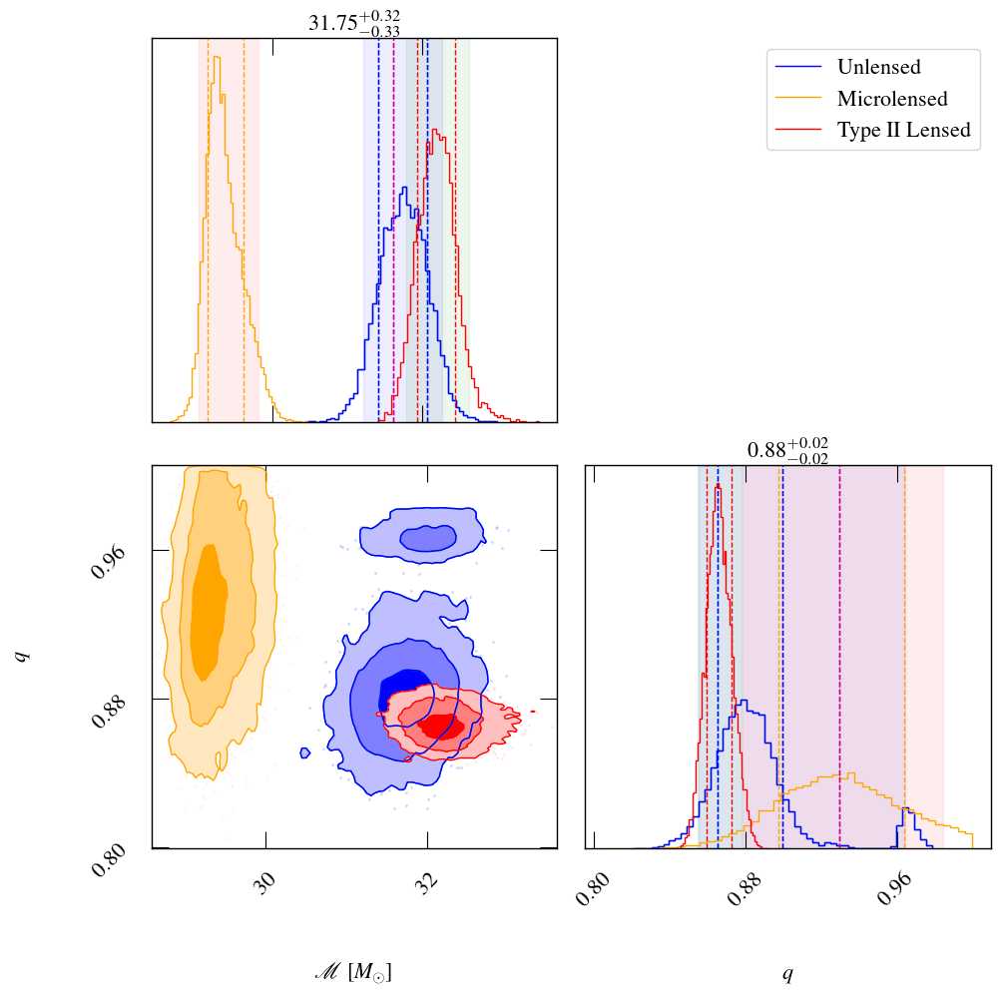

In [43]:
fs_pe = glob('../../output/pe_population_3G/final_result/PE_1.0_0.5_0.02/*')
fs_pe_ml = glob('../../output/pe_population_3G/final_result/PE_ML_1.0_0.5_0.02/*')
fs_pe_ml2 = glob('../../output/pe_population_3G/final_result/PE_ML2_1.0_0.5_0.02/*')

result_pe = bilby.result.read_in_result(filename=fs_pe[0])
result_pe_ml = bilby.result.read_in_result(filename=fs_pe_ml[0])
result_pe_ml2 = bilby.result.read_in_result(filename=fs_pe_ml2[0])
i = 26  
plot1 = bilby.core.result.plot_multiple(
    [result_pe, result_pe_ml, result_pe_ml2], 
    labels=['Unlensed', 'Microlensed', 'Type II Lensed'], 
    parameters=["chirp_mass", "mass_ratio"], 
    colours=['blue', 'orange', 'red'],
    save=False
)
plot1.axes[0].axvspan(np.percentile(result_pe.posterior['chirp_mass'], 5),np.percentile(result_pe.posterior['chirp_mass'], 95), alpha=0.07, color='blue')
plot1.axes[0].axvspan(np.percentile(result_pe_ml.posterior['chirp_mass'], 5),np.percentile(result_pe_ml.posterior['chirp_mass'], 95), alpha=0.07, color='red')
plot1.axes[0].axvspan(np.percentile(result_pe_ml2.posterior['chirp_mass'], 5),np.percentile(result_pe_ml2.posterior['chirp_mass'], 95), alpha=0.07, color='green')
plot1.axes[0].axvline(mchirp_a[i], color='r', linestyle='--', label="Injected $\mathcal{M}_A$")
plot1.axes[0].axvline(mchirp_b[i], color='m', linestyle='--', label="Injected $\mathcal{M}_B$")
plot1.axes[3].axvspan(np.percentile(result_pe.posterior['mass_ratio'], 5),np.percentile(result_pe.posterior['mass_ratio'], 95), alpha=0.07, color='blue')
plot1.axes[3].axvspan(np.percentile(result_pe_ml.posterior['mass_ratio'], 5),np.percentile(result_pe_ml.posterior['mass_ratio'], 95), alpha=0.07, color='red')
plot1.axes[3].axvspan(np.percentile(result_pe_ml2.posterior['mass_ratio'], 5),np.percentile(result_pe_ml2.posterior['mass_ratio'], 95), alpha=0.07, color='green')
plot1.axes[3].axvline(q_a[i], color='r', linestyle='--', label="Injected $q_A$")
plot1.axes[3].axvline(q_b[i], color='m', linestyle='--', label="Injected $q_B$")
plot1.set_size_inches(10, 10)
plt.tight_layout()
plt.savefig('../../output/pe_population_3G/output/LensedPECorner.pdf', dpi=600, bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
import bilby
import pycbc
import pickle
import pycbc.types
import gwpopulation
import numpy as np
import scipy as sp
from glob import glob
import itertools
import gwmat.point_lens as pnt_lens_cy 

In [ ]:
delta_f = 1
duration = 100
minimum_frequency = 20
reference_frequency = 50   # Most sensitive frequency
maximum_frequency = 1024
sampling_frequency = 2048
delta_t = 1/sampling_frequency

mchirpratio, snrratio = [.5, 1., 2.], [.5, 1.]
delta_tc = [-.1, -.05, -.03, -.02, -.01, .01, .02, .03, .05, .1]

combinations = list(itertools.product(mchirpratio, snrratio, delta_tc))

In [ ]:
def inject_wf(injection_parameters):
    """Generate time domain waveforms for the injection parameters, and returns injection projections of a signal onto the Hanford, Livingston, Virgo detectors"""
    waveform_generator = bilby.gw.WaveformGenerator(duration = duration, sampling_frequency = sampling_frequency, start_time = injection_parameters['geocent_time']-duration+2,
                                                    frequency_domain_source_model = bilby.gw.source.lal_binary_black_hole, 
                                                    waveform_arguments = {'waveform_approximant': 'IMRPhenomPv2', 'reference_frequency': reference_frequency, 'minimum_frequency': minimum_frequency})
    ifos = bilby.gw.detector.InterferometerList(['H1', 'L1', 'V1'])   # Initializing the Detectors
    for ifo in ifos:
        ifo.minimum_frequency, ifo.maximum_frequency = minimum_frequency, sampling_frequency/2
    ifos.set_strain_data_from_zero_noise(sampling_frequency = sampling_frequency, duration = duration, start_time = injection_parameters['geocent_time']-duration+2)
    # Injecting the SINGLES GW signal into H1, L1, and V1 using bilby and extrapolating the strain data in the time domain
    ifos.inject_signal(waveform_generator = waveform_generator, parameters = injection_parameters)  
    H1_strain, L1_strain, V1_strain = ifos[0].time_domain_strain, ifos[1].time_domain_strain, ifos[2].time_domain_strain
    # Generating PyCBC TimeSeries from the strain array, setting the start times to the geocenter time, and creating the dictionary of waveforms 
    ht_H1, ht_L1, ht_V1 = pycbc.types.TimeSeries(H1_strain, delta_t = 1/sampling_frequency), pycbc.types.TimeSeries(L1_strain, delta_t = 1/sampling_frequency), pycbc.types.TimeSeries(V1_strain, delta_t = 1/sampling_frequency)
    ht_H1.start_time, ht_L1.start_time, ht_V1.start_time = injection_parameters['geocent_time']-duration+2, injection_parameters['geocent_time']-duration+2, injection_parameters['geocent_time']-duration+2
    ht = {'H1': ht_H1, 'L1': ht_L1, 'V1': ht_V1}
    return ht

with open('git_overlap/src/data/point_lens_Ff_lookup_table_Geo_relErr_1p0.pkl', 'rb') as f:
    Ff_grid = pickle.load(f)
    ys_grid = np.array([Ff_grid[str(i)]['y'] for i in range(len(Ff_grid))])
    ws_grid = Ff_grid['0']['ws']

def pnt_Ff_lookup_table(ys_grid, ws_grid, fs, Mlz, yl, extrapolate=True):
    wfs = np.array([pnt_lens_cy.w_of_f(f, Mlz) for f in fs])
    wc = pnt_lens_cy.w_cutoff_geometric_optics_tolerance_1p0(yl)
    wfs_1 = wfs[wfs <= np.min(ws_grid)]
    Ffs_1 = np.array([1]*len(wfs_1))
    wfs_2 = wfs[(wfs > np.min(ws_grid))&(wfs <= np.max(ws_grid))]
    wfs_2_wave = wfs_2[wfs_2 <= wc]
    wfs_2_geo = wfs_2[wfs_2 > wc]
    i_y  = np.argmin(np.abs(ys_grid - yl))
    ws = Ff_grid[str(i_y)]['ws']
    Ffs = Ff_grid[str(i_y)]['Ffs_real'] + 1j*Ff_grid[str(i_y)]['Ffs_imag']
    fill_val = ['interpolate', 'extrapolate'][extrapolate]
    i_Ff = sp.interpolate.interp1d(ws, Ffs, fill_value=fill_val)
    Ffs_2_wave = i_Ff(wfs_2_wave)
    Ffs_2_geo = np.array([pnt_lens_cy.Fw_geometric_optics(w, yl) for w in wfs_2_geo])
    wfs_3 = wfs[wfs > np.max(ws_grid) ]
    Ffs_3 = np.array([pnt_lens_cy.Fw_geometric_optics(w, Mlz) for w in wfs_3])
    Ffs = np.concatenate((Ffs_1, Ffs_2_wave, Ffs_2_geo, Ffs_3))
    return Ffs, wfs

def inject_wf_lens(injection_parameters, Ml_z, y):
    """Generate microlensed time domain waveforms for the injection parameters, and returns injection projections of a signal onto the Hanford, Livingston, Virgo detectors (using GWMAT)"""
    ht = inject_wf(injection_parameters)
    if round(Ml_z) == 0:
        return ht
    else:
        hf_H1, hf_L1, hf_V1 = ht['H1'].to_frequencyseries(), ht['L1'].to_frequencyseries(), ht['V1'].to_frequencyseries()
        Ff, wfs = pnt_Ff_lookup_table(ys_grid=ys_grid, ws_grid=ws_grid, fs=hf_H1.sample_frequencies, Mlz=Ml_z, yl=y)
        hfl_H1, hfl_L1, hfl_V1 = pycbc.types.FrequencySeries(Ff*hf_H1, delta_f = hf_H1.delta_f), pycbc.types.FrequencySeries(Ff*hf_L1, delta_f = hf_L1.delta_f), pycbc.types.FrequencySeries(Ff*hf_V1, delta_f = hf_V1.delta_f)
        htl_H1, htl_L1, htl_V1 = hfl_H1.to_timeseries(), hfl_L1.to_timeseries(), hfl_V1.to_timeseries()
        htl_H1.start_time, htl_L1.start_time, htl_V1.start_time = injection_parameters['geocent_time']-duration+2, injection_parameters['geocent_time']-duration+2, injection_parameters['geocent_time']-duration+2
        ht_lens = {'H1': htl_H1, 'L1': htl_L1, 'V1': htl_V1}
        return ht_lens, Ff, wfs

In [ ]:
for i in range(len(combinations)):
    fs = glob('git_overlap/src/output/pe_population_3G/final_result/PE_ML_{}_{}_{}/*'.format(combinations[i][0], combinations[i][1], combinations[i][2]))
    result = bilby.result.read_in_result(filename=fs[0])
    nmap = np.argmax(result.posterior['log_likelihood']+result.posterior['log_prior'])
    injection_parameters = {
        'mass_1_source': result.posterior['mass_1_source'][nmap],
        'mass_ratio': result.posterior['mass_ratio'][nmap],
        'mass_1': result.posterior['mass_1'][nmap],
        'mass_2': result.posterior['mass_2'][nmap],
        'luminosity_distance': result.posterior['luminosity_distance'][nmap],
        'redshift': result.posterior['redshift'][nmap],
        'chi_eff': result.posterior['chi_eff'][nmap],
        'a_1': result.posterior['a_1'][nmap],
        'a_2': result.posterior['a_2'][nmap],
        'tilt_1': result.posterior['tilt_1'][nmap],
        'tilt_2': result.posterior['tilt_2'][nmap],
        'theta_jn': result.posterior['theta_jn'][nmap],
        'phi_12': result.posterior['phi_12'][nmap],
        'phi_jl': result.posterior['phi_jl'][nmap],
        'ra': result.posterior['ra'][nmap],
        'dec': result.posterior['dec'][nmap],
        'psi': result.posterior['psi'][nmap],
        'phase': result.posterior['phase'][nmap],
        'incl': result.posterior['iota'][nmap],
        'geocent_time': result.posterior['geocent_time'][nmap]}
    ht_lens, Ff, wfs = inject_wf_lens(injection_parameters, 10**result.posterior['Log_Mlz'][nmap], result.posterior['yl'][nmap])
    with open('git_overlap/src/data/pe_population_3G/ht_{}_{}_{}.pkl'.format(combinations[i][0], combinations[i][1], combinations[i][2]), 'wb') as f:
        pickle.dump(ht_lens, f)

In [ ]:
ht_lens = pickle.load(open('git_overlap/src/data/ht_lens.pkl', 'rb'))

fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(ht_lens['H1'].sample_times, ht_lens['H1'], 'm-', linewidth=1, label='$\\rm{Microlensed}$')
ax.set_xlabel('Time $[s]$')
ax.set_ylabel('Strain $h$')
ax.set_xlim(injection_parameters['geocent_time']-0.7, injection_parameters['geocent_time']+0.1)
ax.legend()
plt.savefig('../..plots/MicrolensedSignals1.pdf', dpi=600, bbox_inches='tight')
plt.show()